# RAINFALL PREDICTION - WEATHER FORECASTING

IMPORTING LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

IMPORTING DATASETS

In [2]:
df=pd.read_csv(r'C:/Users/user/Desktop/DT Python/dataset3-main/weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


its time to divide date column because of its format it is not easier to relate further with the help of drop function we separate year and month into two columns to look good in the dataset

In [3]:
df['Date']=pd.to_datetime(df['Date'])
df['year']=df['Date'].dt.year
df['month']=df['Date'].dt.month
df['day']=df['Date'].dt.day
df.drop(['Date'],axis=1,inplace=True)  
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


In [4]:
df.shape

(8425, 25)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       8425 non-null   object 
 1   MinTemp        8350 non-null   float64
 2   MaxTemp        8365 non-null   float64
 3   Rainfall       8185 non-null   float64
 4   Evaporation    4913 non-null   float64
 5   Sunshine       4431 non-null   float64
 6   WindGustDir    7434 non-null   object 
 7   WindGustSpeed  7434 non-null   float64
 8   WindDir9am     7596 non-null   object 
 9   WindDir3pm     8117 non-null   object 
 10  WindSpeed9am   8349 non-null   float64
 11  WindSpeed3pm   8318 non-null   float64
 12  Humidity9am    8366 non-null   float64
 13  Humidity3pm    8323 non-null   float64
 14  Pressure9am    7116 non-null   float64
 15  Pressure3pm    7113 non-null   float64
 16  Cloud9am       6004 non-null   float64
 17  Cloud3pm       5970 non-null   float64
 18  Temp9am 

there are missing values in the dataset and it includes numeric and categorical value

In [6]:
df['RainToday'].replace({'No' : 0, 'Yes' : 1}, inplace = True)
df['RainTomorrow'].replace({'No' : 0, 'Yes' : 1}, inplace=True)


In [7]:
df.fillna('0')

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,Albury,13.4,22.9,0.6,0,0,W,44.0,W,WNW,...,1007.1,8.0,0,16.9,21.8,0.0,0.0,2008,12,1
1,Albury,7.4,25.1,0.0,0,0,WNW,44.0,NNW,WSW,...,1007.8,0,0,17.2,24.3,0.0,0.0,2008,12,2
2,Albury,12.9,25.7,0.0,0,0,WSW,46.0,W,WSW,...,1008.7,0,2.0,21.0,23.2,0.0,0.0,2008,12,3
3,Albury,9.2,28.0,0.0,0,0,NE,24.0,SE,E,...,1012.8,0,0,18.1,26.5,0.0,0.0,2008,12,4
4,Albury,17.5,32.3,1.0,0,0,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,0,0,E,31.0,SE,ENE,...,1020.3,0,0,10.1,22.4,0.0,0.0,2017,6,21
8421,Uluru,3.6,25.3,0.0,0,0,NNW,22.0,SE,N,...,1019.1,0,0,10.9,24.5,0.0,0.0,2017,6,22
8422,Uluru,5.4,26.9,0.0,0,0,N,37.0,SE,WNW,...,1016.8,0,0,12.5,26.1,0.0,0.0,2017,6,23
8423,Uluru,7.8,27.0,0.0,0,0,SE,28.0,SSE,N,...,1016.5,3.0,2.0,15.1,26.0,0.0,0.0,2017,6,24


In [8]:
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'year', 'month', 'day'],
      dtype='object')

In [9]:
df.iterrows

<bound method DataFrame.iterrows of      Location  MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine WindGustDir  \
0      Albury     13.4     22.9       0.6          NaN       NaN           W   
1      Albury      7.4     25.1       0.0          NaN       NaN         WNW   
2      Albury     12.9     25.7       0.0          NaN       NaN         WSW   
3      Albury      9.2     28.0       0.0          NaN       NaN          NE   
4      Albury     17.5     32.3       1.0          NaN       NaN           W   
...       ...      ...      ...       ...          ...       ...         ...   
8420    Uluru      2.8     23.4       0.0          NaN       NaN           E   
8421    Uluru      3.6     25.3       0.0          NaN       NaN         NNW   
8422    Uluru      5.4     26.9       0.0          NaN       NaN           N   
8423    Uluru      7.8     27.0       0.0          NaN       NaN          SE   
8424    Uluru     14.9      NaN       0.0          NaN       NaN         NaN   

   

In [10]:
df.describe(include='all')

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
count,8425,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434,7434.000000,7596,8117,...,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000,8185.000000,8186.000000,8425.000000,8425.000000,8425.000000
unique,12,NaN,NaN,NaN,NaN,NaN,16,NaN,16,16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Melbourne,NaN,NaN,NaN,NaN,NaN,N,NaN,N,SE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1622,NaN,NaN,NaN,NaN,NaN,713,NaN,906,813,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,13.193305,23.859976,2.805913,5.389395,7.632205,NaN,40.174469,NaN,NaN,...,1015.236075,4.566622,4.503183,17.762015,22.442934,0.243128,0.243220,2012.102433,6.442136,15.741958
std,NaN,5.403596,6.136408,10.459379,5.044484,3.896235,NaN,14.665721,NaN,NaN,...,6.766681,2.877658,2.731659,5.627035,5.980020,0.428998,0.429053,2.473137,3.437994,8.787354
min,NaN,-2.000000,8.200000,0.000000,0.000000,0.000000,NaN,7.000000,NaN,NaN,...,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000,2008.000000,1.000000,1.000000
25%,NaN,9.200000,19.300000,0.000000,2.600000,4.750000,NaN,30.000000,NaN,NaN,...,1010.400000,1.000000,2.000000,13.800000,18.000000,0.000000,0.000000,2010.000000,3.000000,8.000000
50%,NaN,13.300000,23.300000,0.000000,4.600000,8.700000,NaN,39.000000,NaN,NaN,...,1015.300000,5.000000,5.000000,17.800000,21.900000,0.000000,0.000000,2011.000000,6.000000,16.000000
75%,NaN,17.400000,28.000000,1.000000,7.000000,10.700000,NaN,50.000000,NaN,NaN,...,1019.800000,7.000000,7.000000,21.900000,26.400000,0.000000,0.000000,2014.000000,9.000000,23.000000


In [11]:
df.isnull().sum()

Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
year                0
month               0
day                 0
dtype: int64

CORRELATION HEATMAP

In [12]:
corr=df.corr()
corr.shape

(21, 21)

In [13]:
corr

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
MinTemp,1.000000,0.720955,0.091642,0.348643,0.081365,0.241317,0.137263,0.180091,-0.130906,0.079569,...,-0.458665,0.111213,0.046889,0.888342,0.689652,0.069946,0.099464,0.044324,-0.247142,0.009494
MaxTemp,0.720955,1.000000,-0.088906,0.424728,0.523909,0.146113,0.013425,0.088797,-0.392496,-0.424217,...,-0.430074,-0.307700,-0.301675,0.869503,0.978665,-0.229293,-0.154657,0.120234,-0.163891,0.015668
Rainfall,0.091642,-0.088906,1.000000,0.043463,-0.209654,0.104999,0.051349,0.025185,0.231702,0.238730,...,-0.037270,0.195157,0.159250,-0.007191,-0.092263,0.463211,0.225180,0.006530,-0.012522,-0.013953
Evaporation,0.348643,0.424728,0.043463,1.000000,0.340893,0.214069,0.176701,0.142421,-0.286869,-0.221244,...,-0.233401,-0.084288,-0.152637,0.405467,0.414156,-0.121856,-0.081179,0.256852,0.005729,0.017785
Sunshine,0.081365,0.523909,-0.209654,0.340893,1.000000,-0.018455,-0.025112,0.045031,-0.512349,-0.630536,...,-0.047098,-0.705577,-0.723957,0.348708,0.546057,-0.338018,-0.471405,0.144615,-0.009156,0.006420
WindGustSpeed,0.241317,0.146113,0.104999,0.214069,-0.018455,1.000000,0.656079,0.711403,-0.286045,-0.097380,...,-0.394745,0.030124,0.104157,0.211477,0.106872,0.089015,0.211384,-0.045032,0.055158,-0.003062
WindSpeed9am,0.137263,0.013425,0.051349,0.176701,-0.025112,0.656079,1.000000,0.566322,-0.358981,-0.111595,...,-0.156517,-0.000607,0.068930,0.109936,-0.002619,0.039941,0.073335,-0.089133,0.038668,-0.003081
WindSpeed3pm,0.180091,0.088797,0.025185,0.142421,0.045031,0.711403,0.566322,1.000000,-0.252488,-0.091248,...,-0.240378,0.005807,0.003894,0.185329,0.066201,0.022351,0.058073,-0.051882,0.049760,-0.009017
Humidity9am,-0.130906,-0.392496,0.231702,-0.286869,-0.512349,-0.286045,-0.358981,-0.252488,1.000000,0.636255,...,0.188463,0.472126,0.352736,-0.378389,-0.383788,0.382923,0.279701,0.100085,-0.116017,0.003814
Humidity3pm,0.079569,-0.424217,0.238730,-0.221244,-0.630536,-0.097380,-0.111595,-0.091248,0.636255,1.000000,...,0.076002,0.509797,0.520221,-0.130973,-0.491634,0.367895,0.457160,-0.029118,-0.074601,0.012590


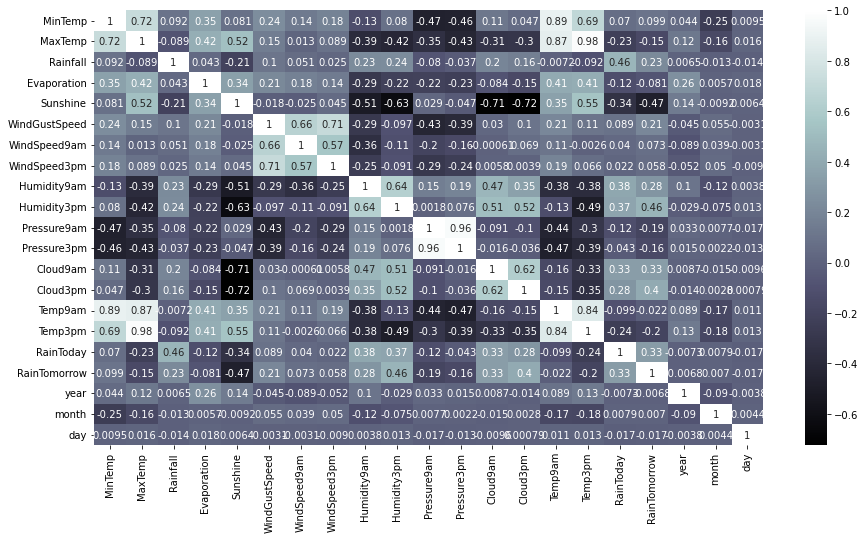

In [14]:
plt.figure(figsize=(15,8))
sns.heatmap(corr,annot=True,cmap='bone')
plt.show()

In [15]:
type(df)

pandas.core.frame.DataFrame

In [16]:
df.dtypes

Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday        float64
RainTomorrow     float64
year               int64
month              int64
day                int64
dtype: object

DATA VISUALIZATION

<AxesSubplot:title={'center':'Evaporation'}>

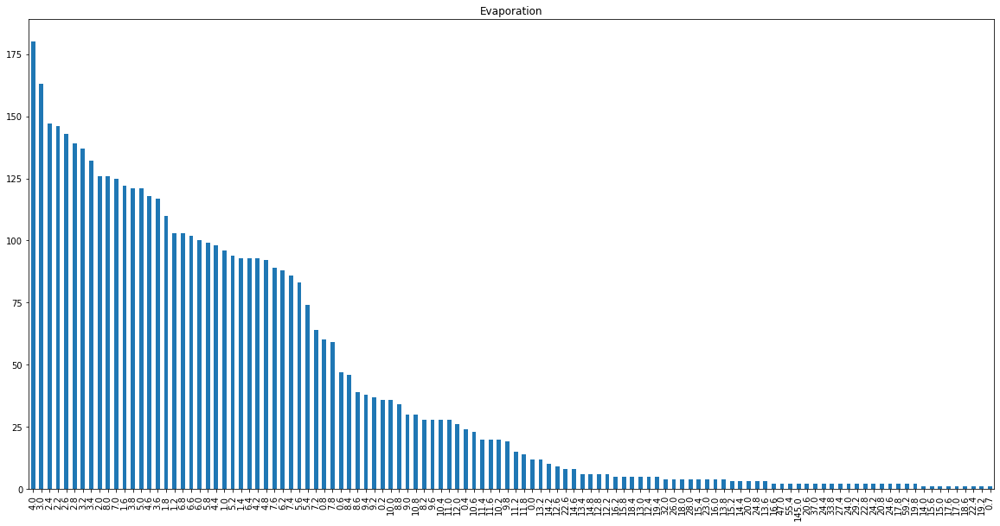

In [17]:
plt.subplot()
df['Evaporation'].value_counts().plot(kind='bar',title='Evaporation',figsize=(20,10))

<AxesSubplot:title={'center':'RainToday'}>

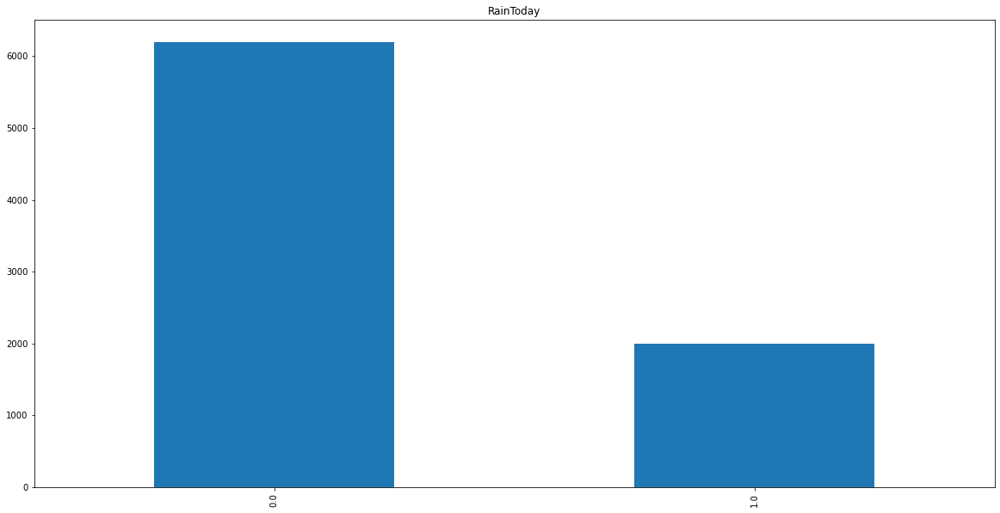

In [18]:
plt.subplot()
df['RainToday'].value_counts().plot(kind='bar',title='RainToday',figsize=(20,10))

<AxesSubplot:title={'center':'RainTomorrow'}>

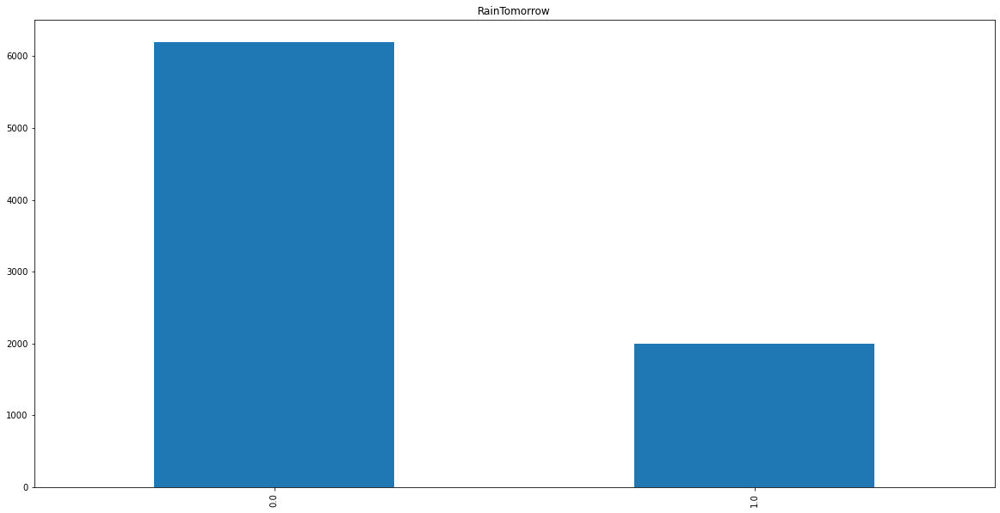

In [19]:
plt.subplot()
df['RainTomorrow'].value_counts().plot(kind='bar',title='RainTomorrow',figsize=(20,10))

<AxesSubplot:title={'center':'Wind Gust Speed'}>

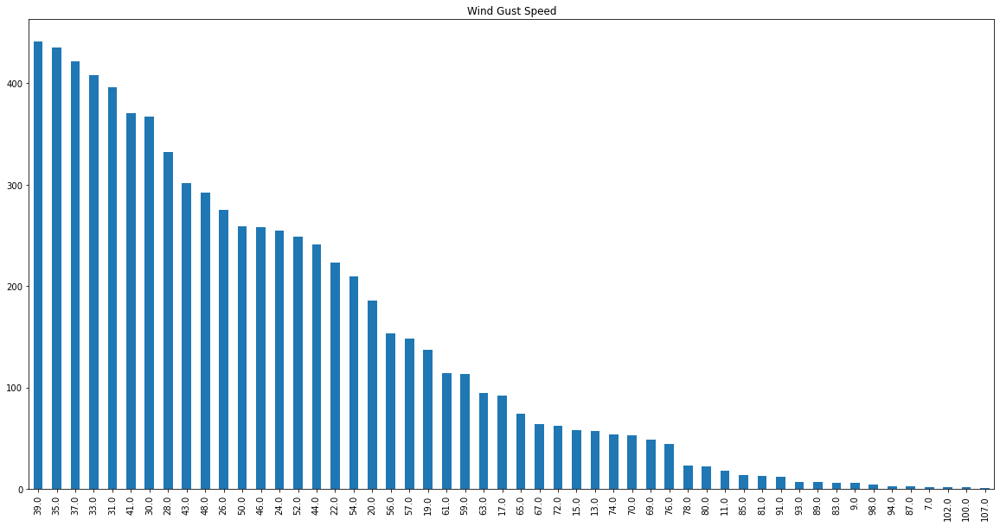

In [20]:
plt.subplot()
df['WindGustSpeed'].value_counts().plot(kind='bar',title='Wind Gust Speed',figsize=(20,10))

<AxesSubplot:title={'center':'Wind Gust Direction'}>

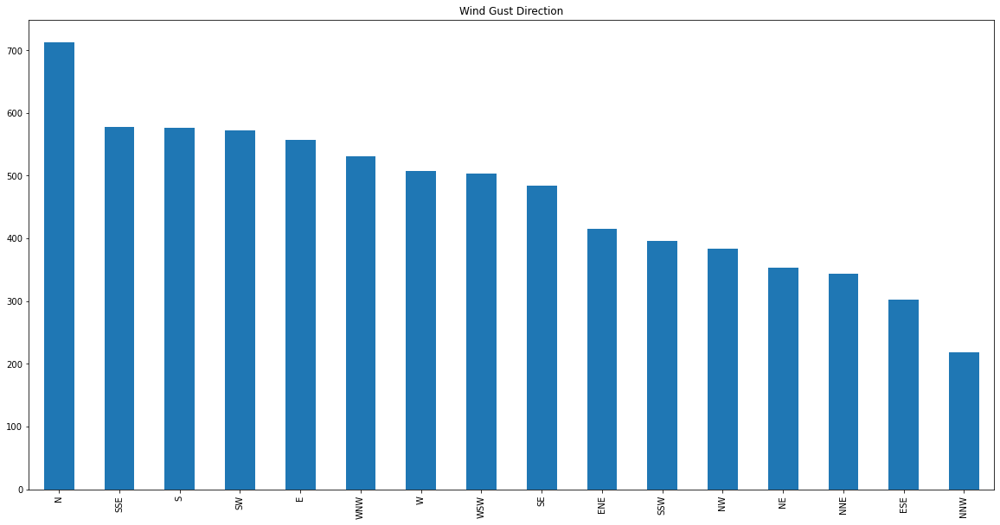

In [21]:
plt.subplot()
df['WindGustDir'].value_counts().plot(kind='bar',title='Wind Gust Direction',figsize=(20,10))

<AxesSubplot:title={'center':'Cloud at 9am'}>

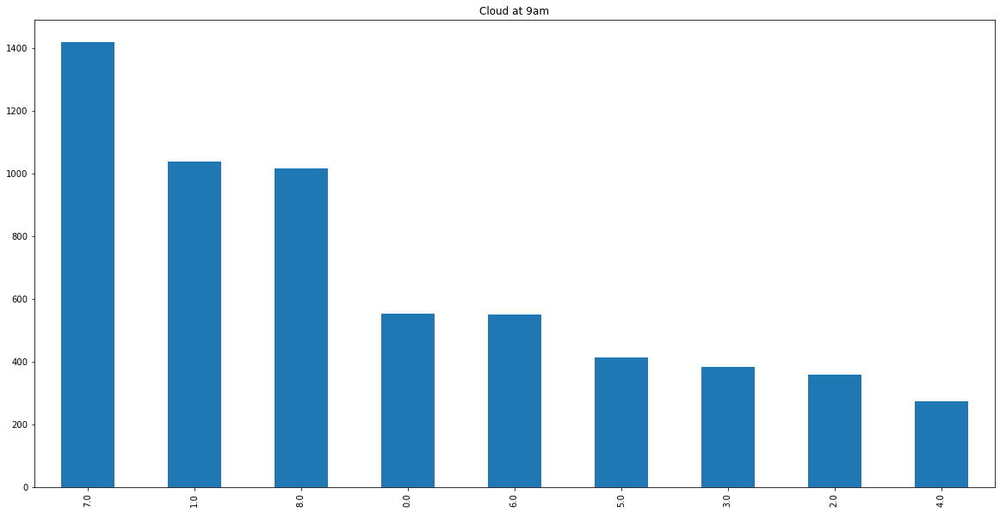

In [22]:
plt.subplot()
df['Cloud9am'].value_counts().plot(kind='bar',title='Cloud at 9am',figsize=(20,10))

<AxesSubplot:title={'center':'Cloud at 3pm'}>

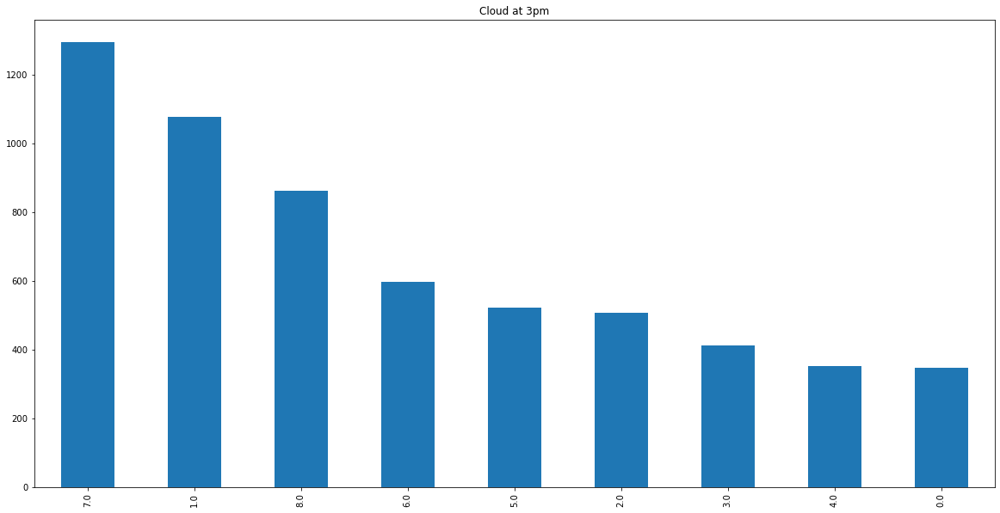

In [23]:
plt.subplot()
df['Cloud3pm'].value_counts().plot(kind='bar',title='Cloud at 3pm',figsize=(20,10))

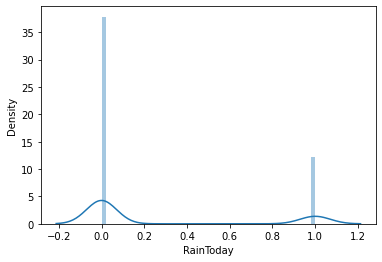

In [24]:
sns.distplot(df['RainToday']);

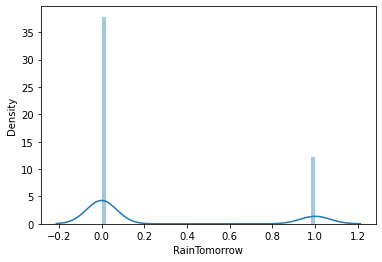

In [25]:
sns.distplot(df['RainTomorrow']);

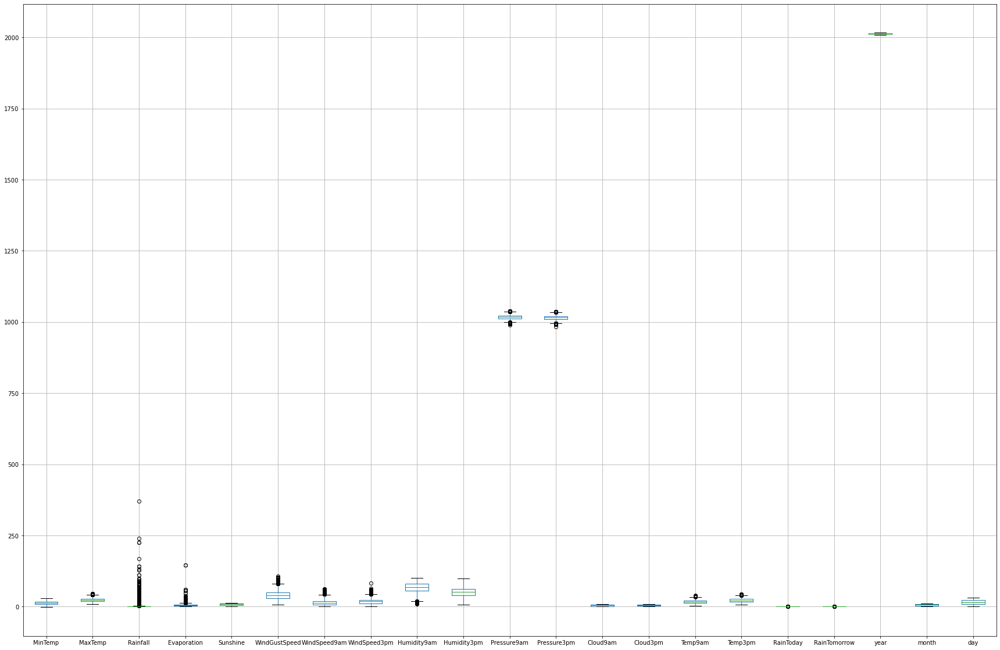

In [26]:
plt.figure(figsize=(30,20))
df.boxplot();

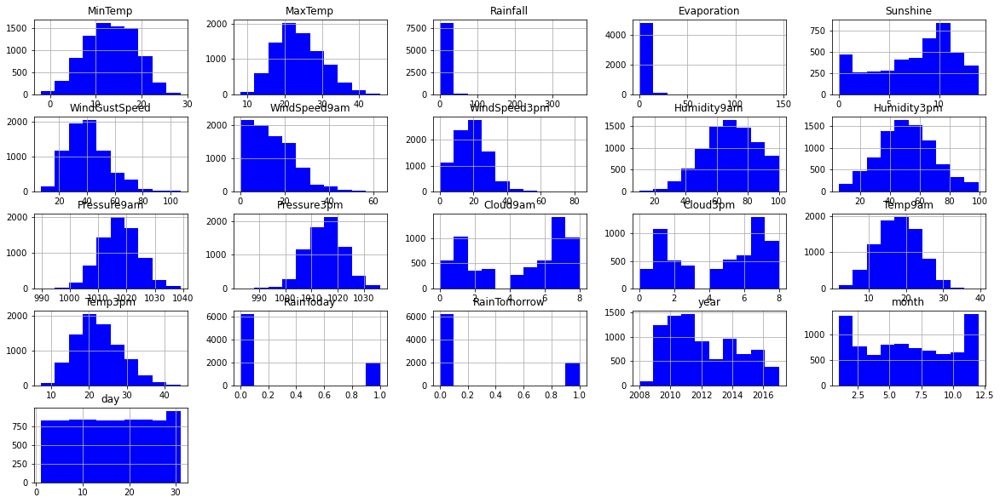

In [27]:
df.hist(color='b',figsize=(20,10))
plt.show()

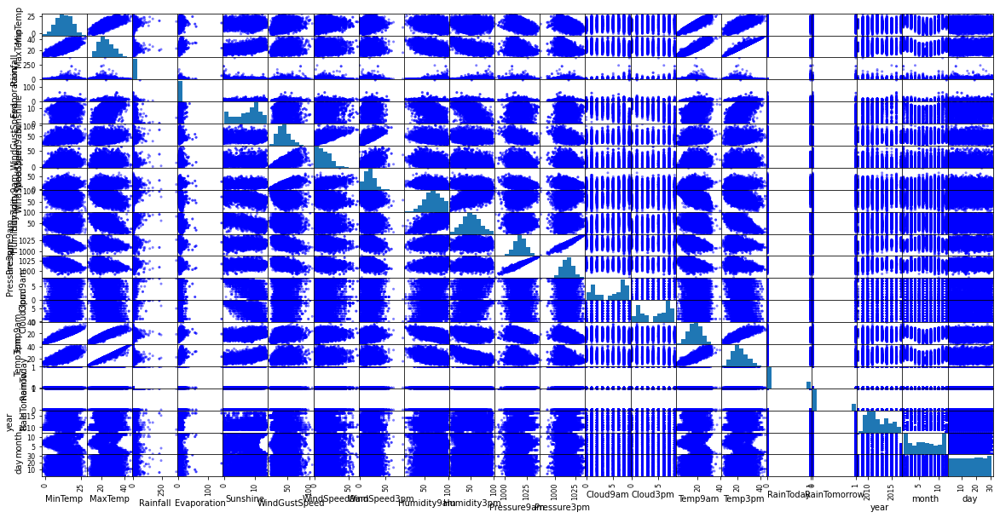

In [28]:
from pandas.plotting import scatter_matrix
scatter_matrix(df,figsize=(20,10),color='b')
plt.show()

DISTRIBUTIONPLOT

<AxesSubplot:xlabel='MaxTemp'>

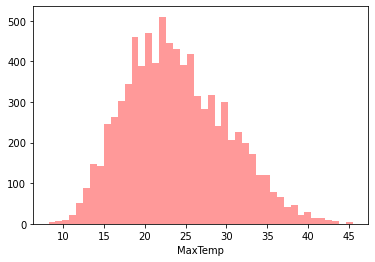

In [29]:
sns.distplot(df['MaxTemp'],kde=False,color='r')

<AxesSubplot:xlabel='MinTemp'>

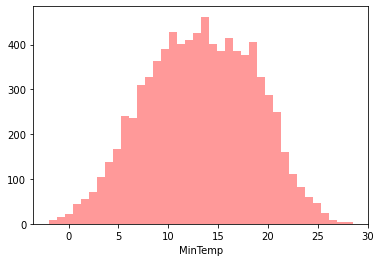

In [30]:
sns.distplot(df['MinTemp'],kde=False,color='r')

<AxesSubplot:xlabel='Rainfall'>

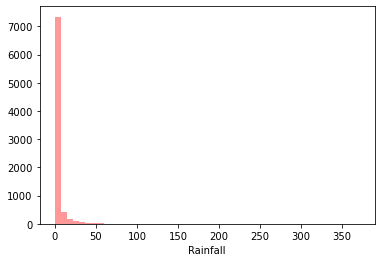

In [31]:
sns.distplot(df['Rainfall'],kde=False,color='r')

<AxesSubplot:xlabel='year'>

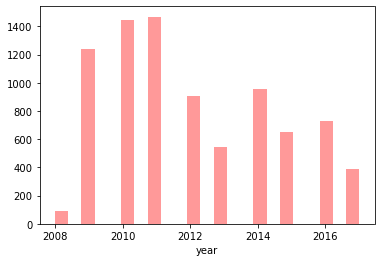

In [32]:
sns.distplot(df['year'],kde=False,color='r')

<AxesSubplot:xlabel='Evaporation'>

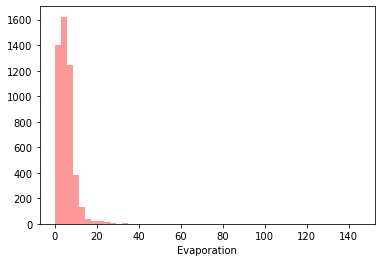

In [33]:
sns.distplot(df['Evaporation'],kde=False,color='r')

SCATTERPLOT

              RainToday  RainTomorrow
RainToday      1.000000      0.325093
RainTomorrow   0.325093      1.000000


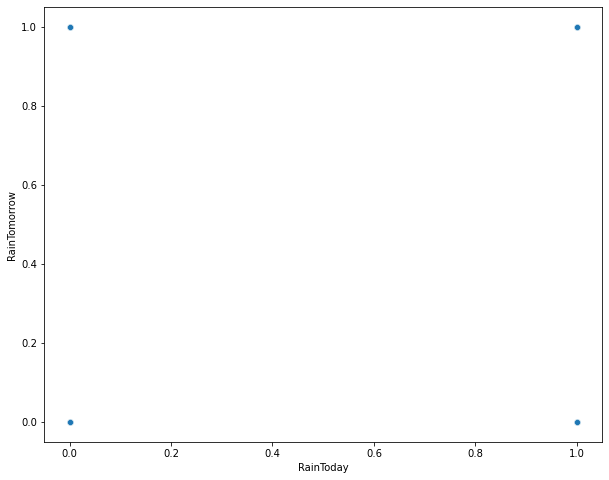

In [34]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['RainToday'], df['RainTomorrow'])
print(df[['RainToday' , 'RainTomorrow']].corr())
plt.show()

           Rainfall  RainToday
Rainfall   1.000000   0.463211
RainToday  0.463211   1.000000


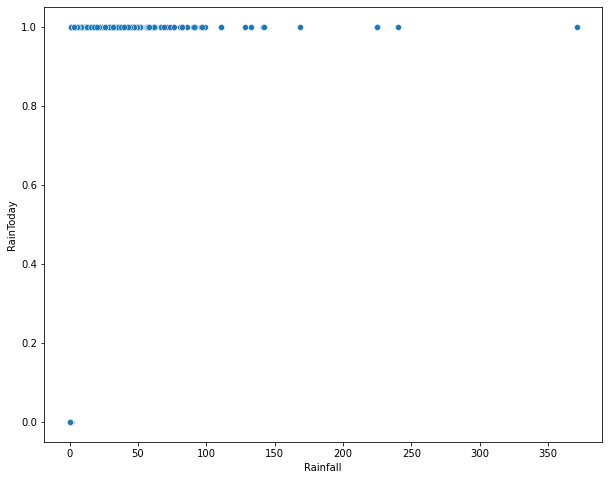

In [35]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['Rainfall'], df['RainToday'])
print(df[['Rainfall' , 'RainToday']].corr())
plt.show()

              Rainfall  RainTomorrow
Rainfall       1.00000       0.22518
RainTomorrow   0.22518       1.00000


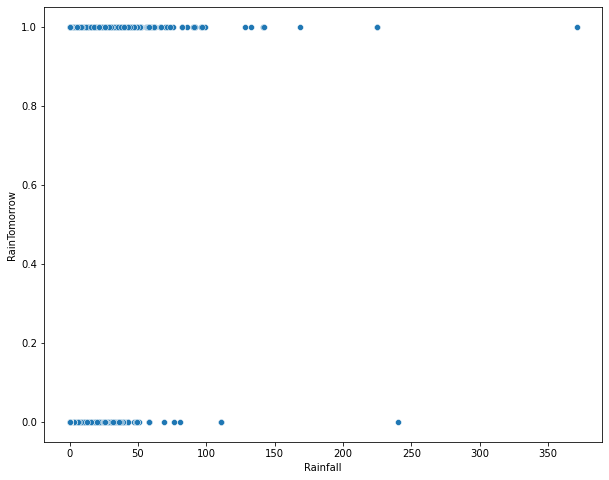

In [36]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['Rainfall'], df['RainTomorrow'])
print(df[['Rainfall' , 'RainTomorrow']].corr())
plt.show()

COUNTPLOT  OF TARGET COLUMN

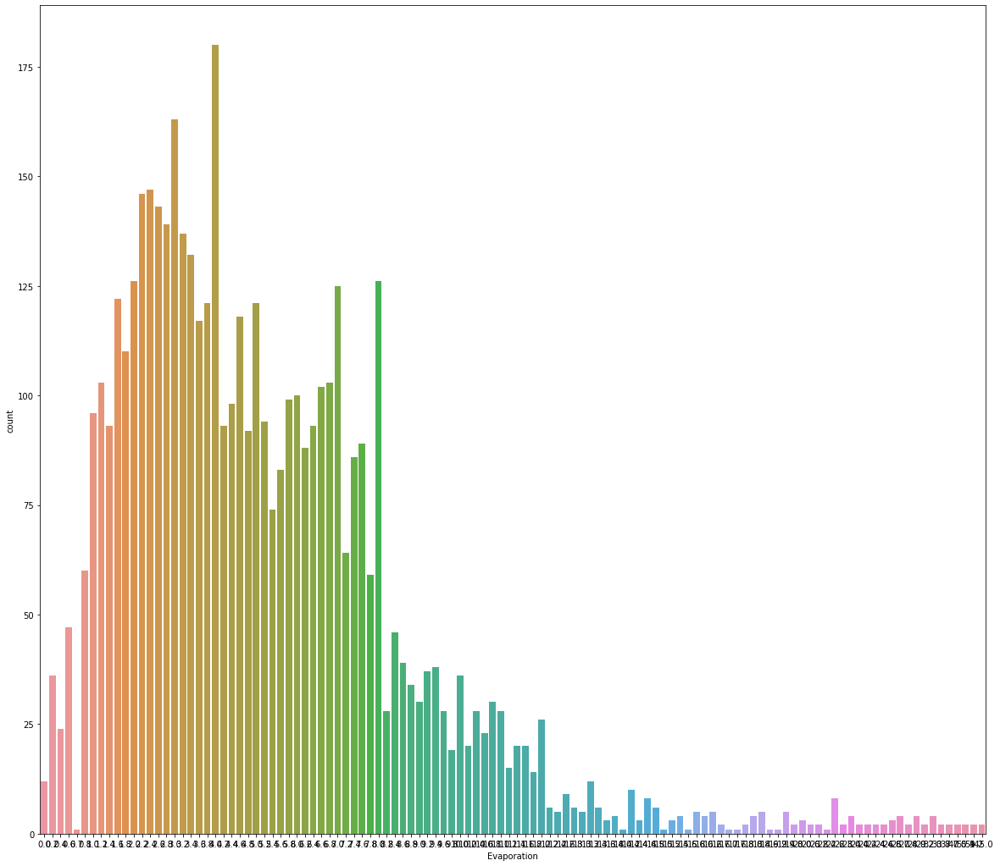

In [37]:
plt.figure(figsize=(20,18))
sns.countplot(df['Evaporation'])
plt.show()

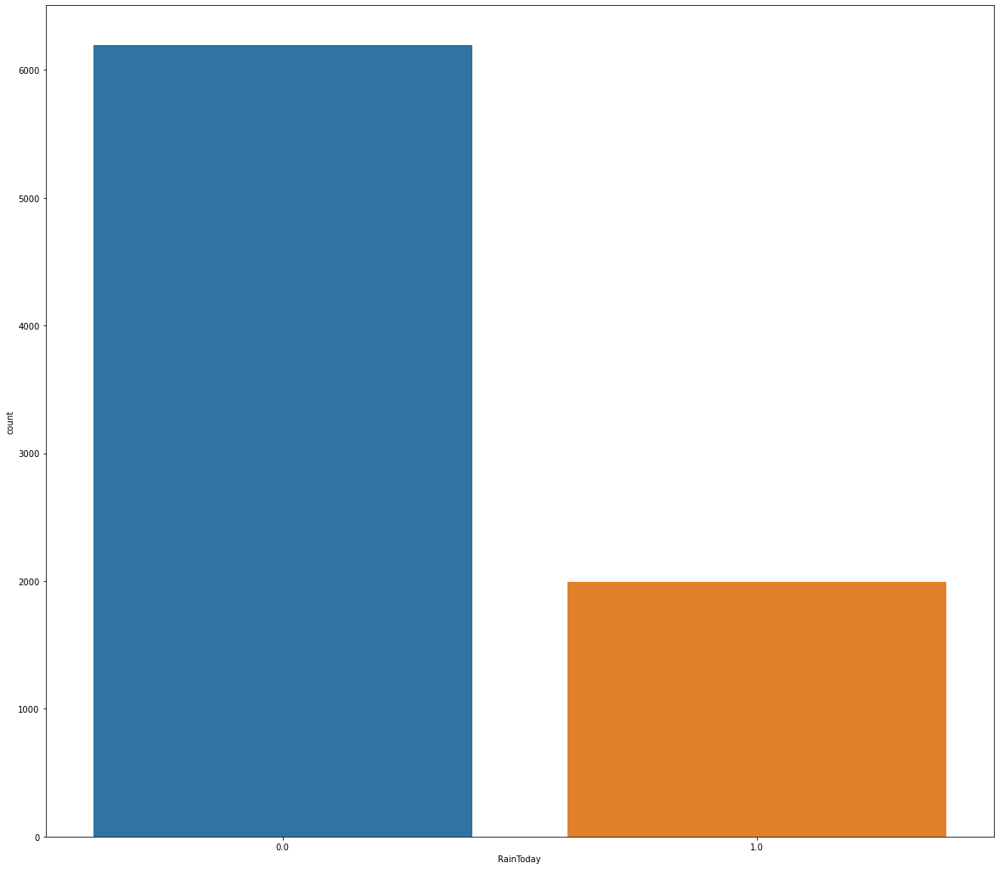

In [38]:
plt.figure(figsize=(20,18))
sns.countplot(df['RainToday'])
plt.show()

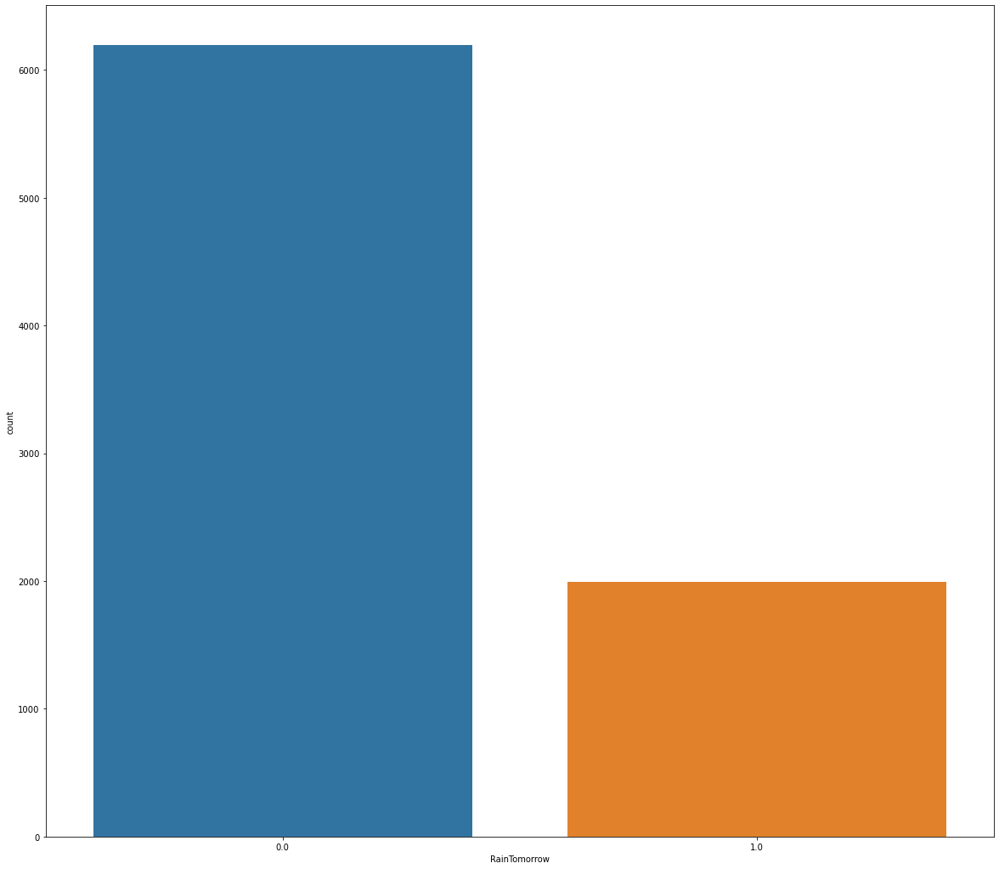

In [39]:
plt.figure(figsize=(20,18))
sns.countplot(df['RainTomorrow'])
plt.show()

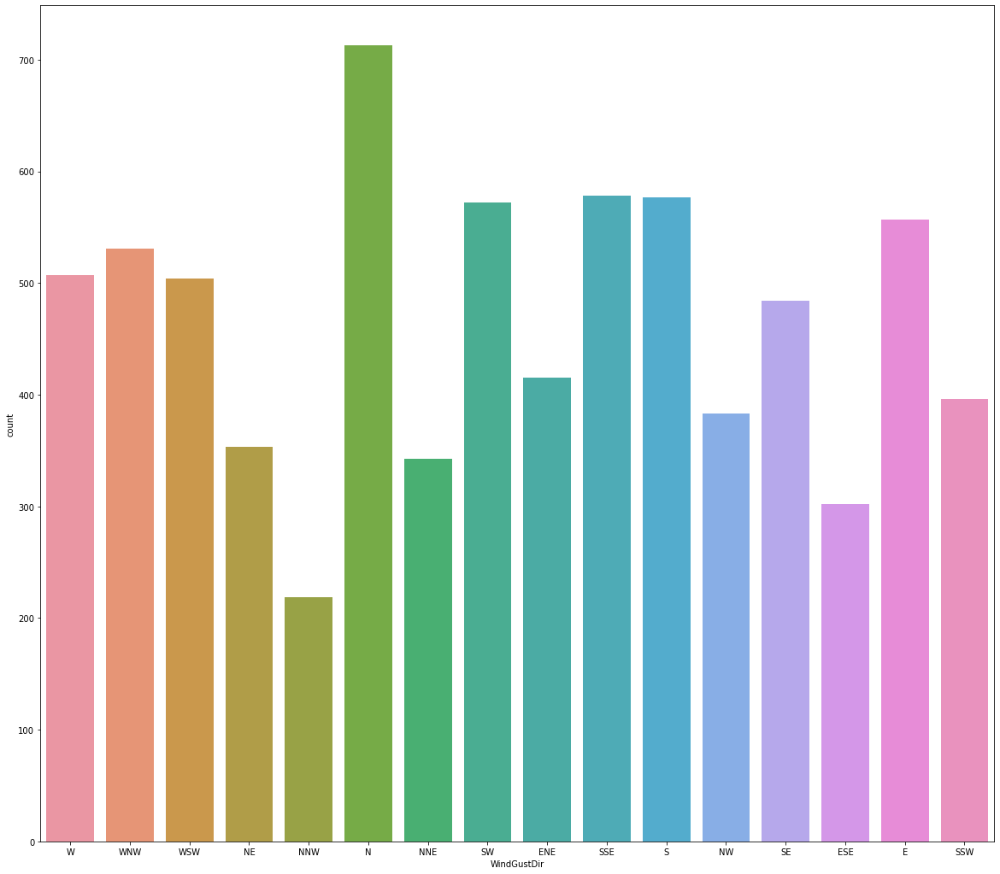

In [40]:
plt.figure(figsize=(20,18))
sns.countplot(df['WindGustDir'])
plt.show()

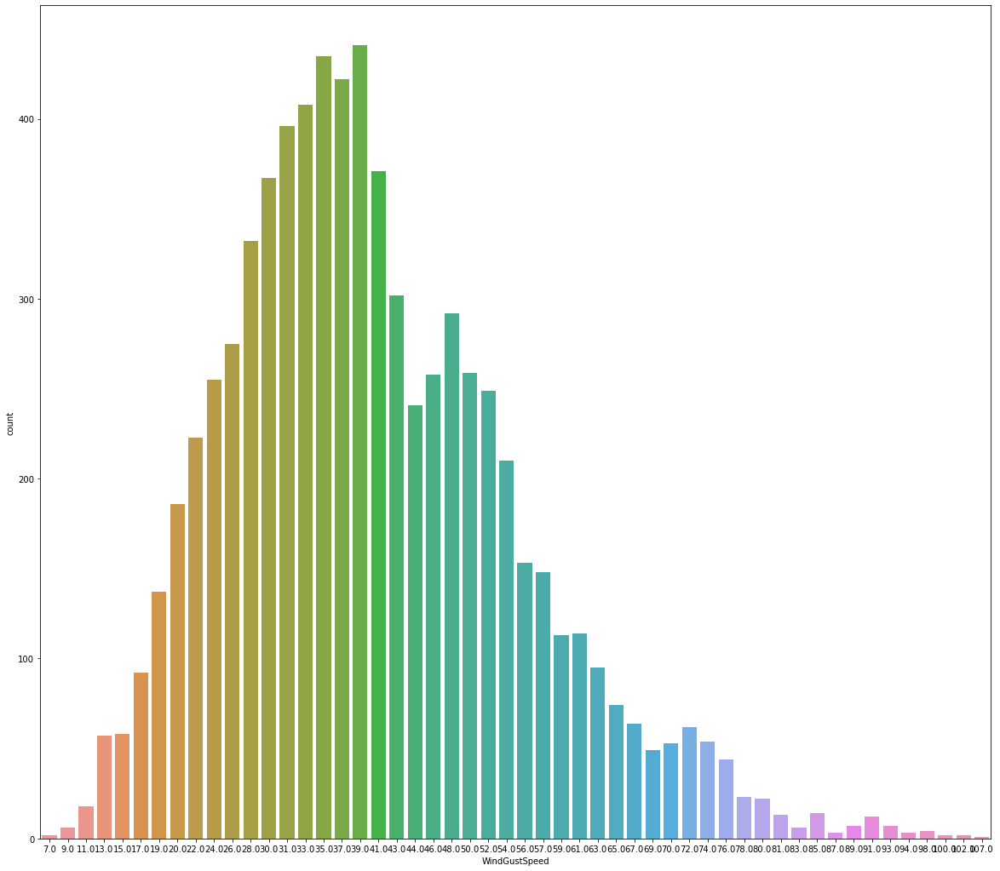

In [41]:
plt.figure(figsize=(20,18))
sns.countplot(df['WindGustSpeed'])
plt.show()

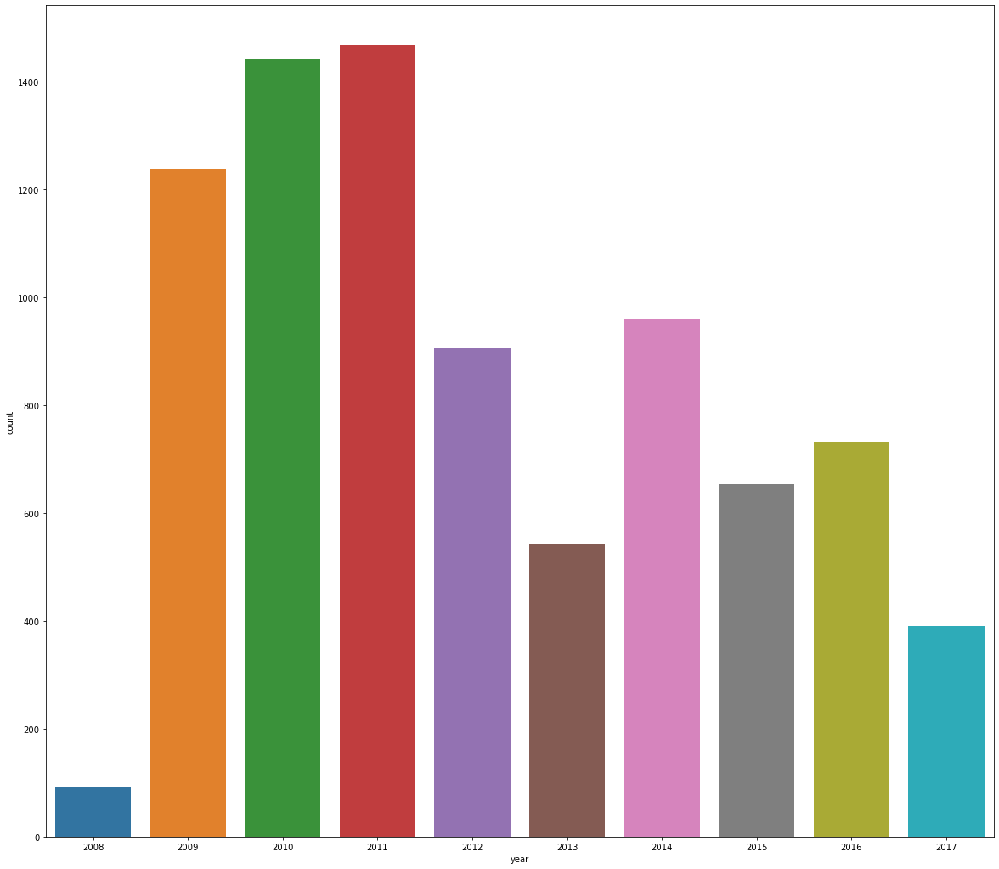

In [42]:
plt.figure(figsize=(20,18))
sns.countplot(df['year'])
plt.show()

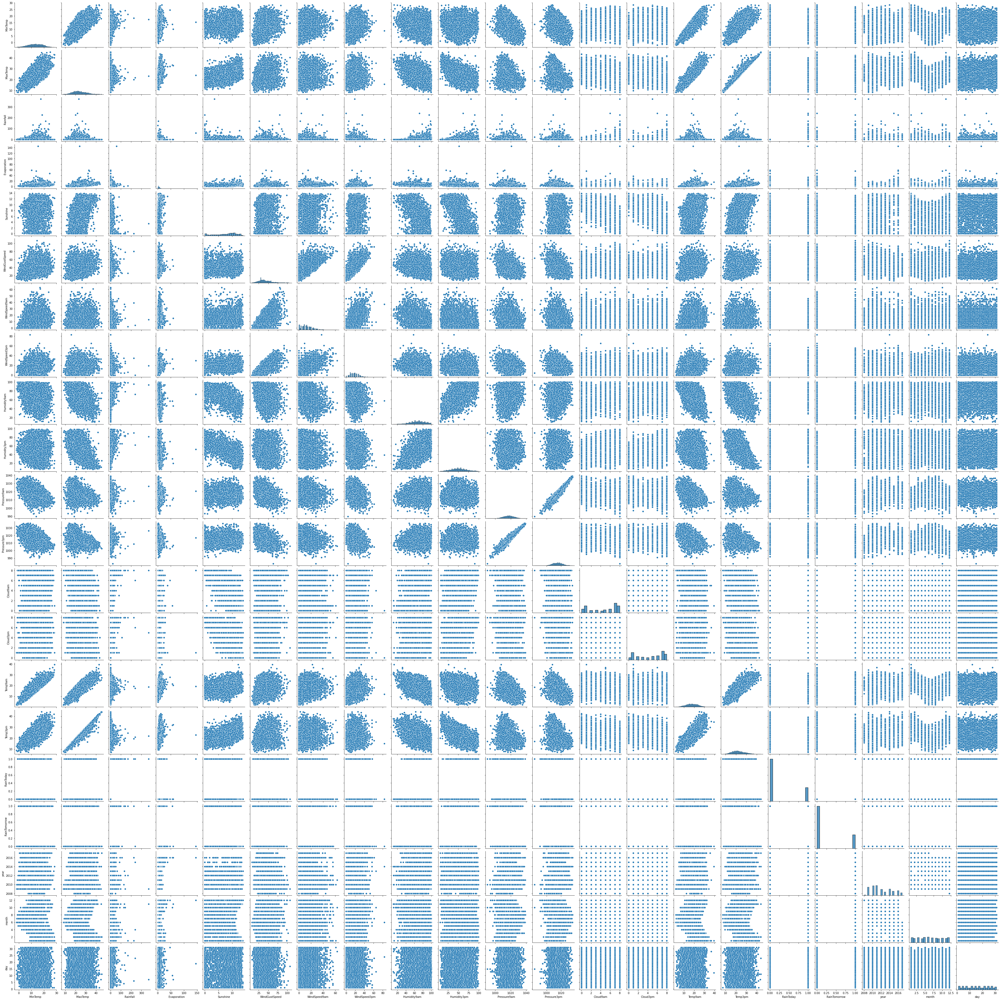

In [43]:
sns.pairplot(df)

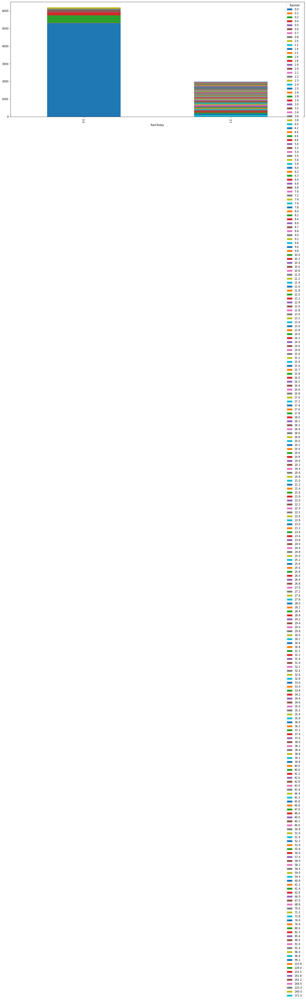

In [44]:
data=pd.crosstab(df['RainToday'], df['Rainfall'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

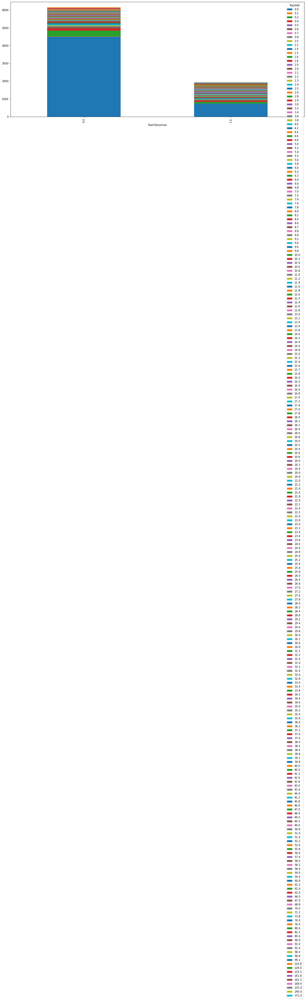

In [45]:
data=pd.crosstab(df['RainTomorrow'], df['Rainfall'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

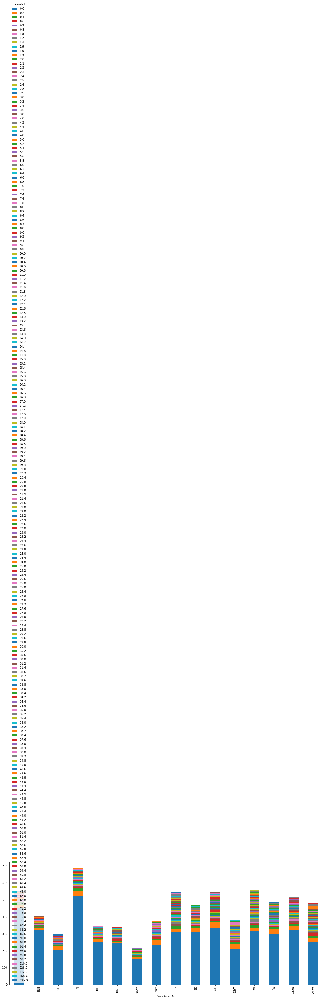

In [46]:
data=pd.crosstab(df['WindGustDir'], df['Rainfall'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

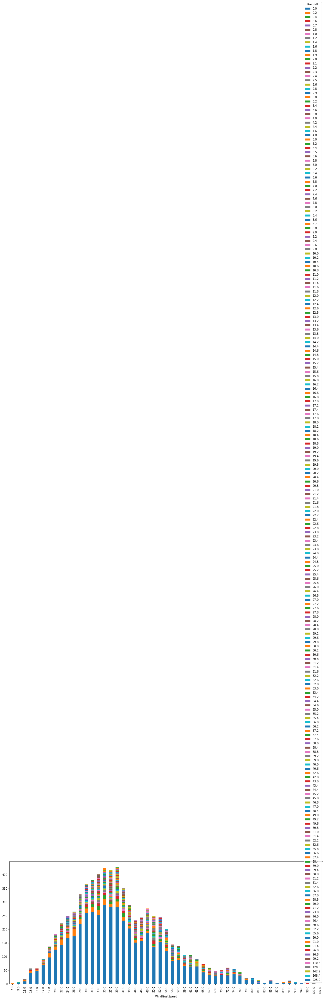

In [47]:
data=pd.crosstab(df['WindGustSpeed'], df['Rainfall'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

BOXPLOT

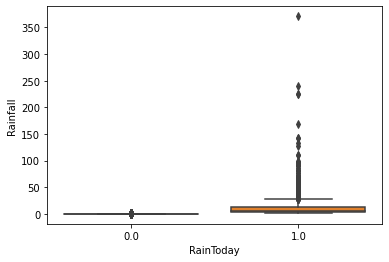

In [48]:
sns.boxplot(x='RainToday', y='Rainfall', data=df)
plt.show()

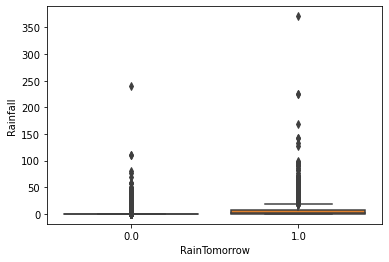

In [49]:
sns.boxplot(x='RainTomorrow', y='Rainfall', data=df)
plt.show()

CORRELATION  AMONG NUMERIC ATTRIBUTES

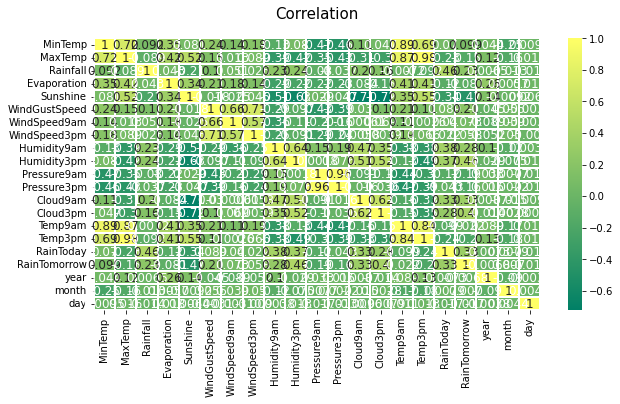

In [50]:
def correlation_heatmap(df):
    ax=plt.subplots(figsize=(10,5))
    colormap=sns.diverging_palette(220, 10, as_cmap = True)
    ax=sns.heatmap(df.corr(),cmap="summer",annot=True,linewidths=0.1,vmax=1.0,linecolor='white',annot_kws={'fontsize':12})
    plt.title('Correlation',y=1.05,size=15)

correlation_heatmap(df)

Text(0.5, 0, 'Month')

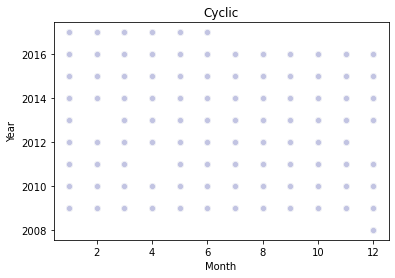

In [51]:
#parse the data
cyclic=sns.scatterplot(x='month',y='year',data=df,color="#C2C4E2")
cyclic.set_title("Cyclic")
cyclic.set_ylabel("Year")
cyclic.set_xlabel("Month")

Text(0.5, 0, 'Month')

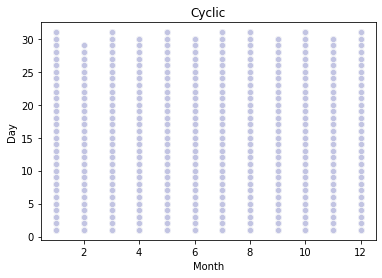

In [52]:
cyclic=sns.scatterplot(x='month',y='day',data=df,color="#C2C4E2")
cyclic.set_title("Cyclic")
cyclic.set_ylabel("Day")
cyclic.set_xlabel("Month")

In [53]:
#categorical  value
s=(df.dtypes=="object")
object_cols=list(s[s].index)
print("categorical values: ")
print(object_cols)

categorical values: 
['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']


In [54]:
for i in object_cols:
    print(i, df[i].isnull().sum())

Location 0
WindGustDir 991
WindDir9am 829
WindDir3pm 308


In [55]:
for i in object_cols:
    df[i].fillna(df[i].mode()[0], inplace=True)

In [56]:
# numerical value
n=(df.dtypes=="float64")
num_cols=list(n[n].index)
print("Numeric variables: ")
print(num_cols)

Numeric variables: 
['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']


In [57]:
for i in num_cols:
    print(i, df[i].isnull().sum())

MinTemp 75
MaxTemp 60
Rainfall 240
Evaporation 3512
Sunshine 3994
WindGustSpeed 991
WindSpeed9am 76
WindSpeed3pm 107
Humidity9am 59
Humidity3pm 102
Pressure9am 1309
Pressure3pm 1312
Cloud9am 2421
Cloud3pm 2455
Temp9am 56
Temp3pm 96
RainToday 240
RainTomorrow 239


In [58]:
for i in num_cols:
    df[i].fillna(df[i].median(),inplace=True)
df.info()    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       8425 non-null   object 
 1   MinTemp        8425 non-null   float64
 2   MaxTemp        8425 non-null   float64
 3   Rainfall       8425 non-null   float64
 4   Evaporation    8425 non-null   float64
 5   Sunshine       8425 non-null   float64
 6   WindGustDir    8425 non-null   object 
 7   WindGustSpeed  8425 non-null   float64
 8   WindDir9am     8425 non-null   object 
 9   WindDir3pm     8425 non-null   object 
 10  WindSpeed9am   8425 non-null   float64
 11  WindSpeed3pm   8425 non-null   float64
 12  Humidity9am    8425 non-null   float64
 13  Humidity3pm    8425 non-null   float64
 14  Pressure9am    8425 non-null   float64
 15  Pressure3pm    8425 non-null   float64
 16  Cloud9am       8425 non-null   float64
 17  Cloud3pm       8425 non-null   float64
 18  Temp9am 

<AxesSubplot:xlabel='day', ylabel='Rainfall'>

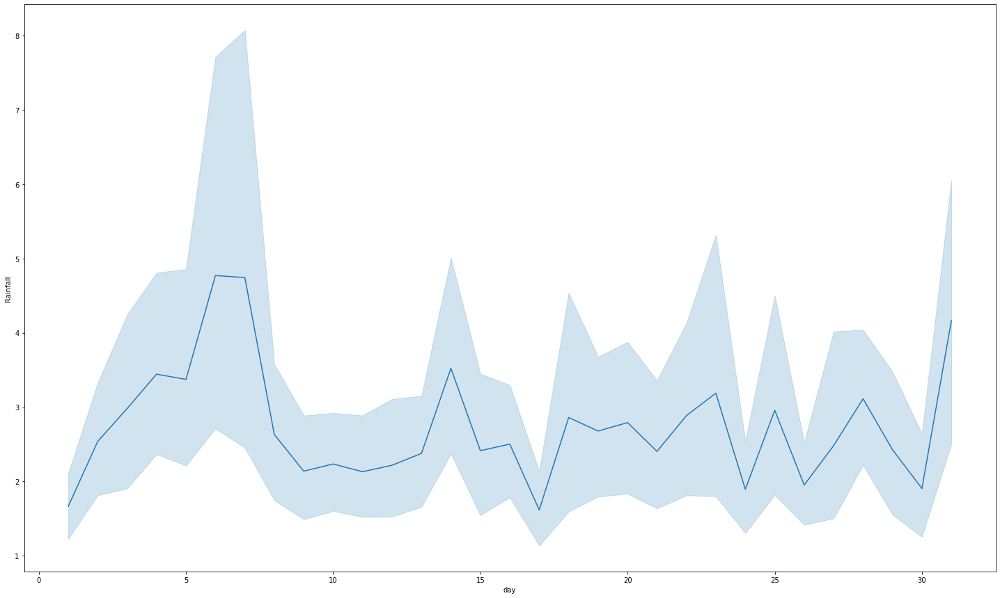

In [59]:
plt.figure(figsize=(25,15))
sns.lineplot(x='day',y='Rainfall',data=df)

<AxesSubplot:xlabel='day', ylabel='RainToday'>

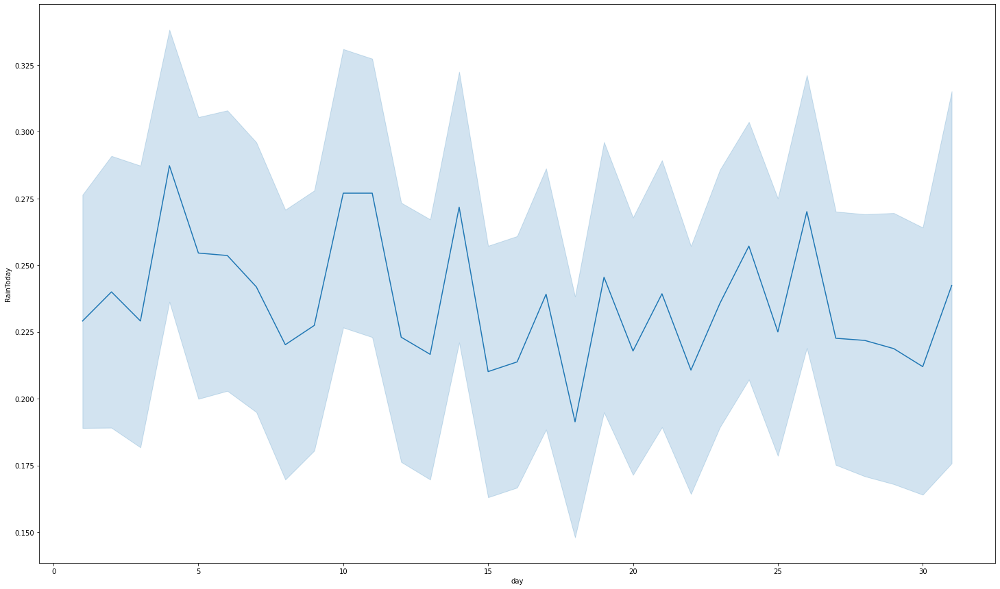

In [60]:
plt.figure(figsize=(25,15))
sns.lineplot(x='day',y='RainToday',data=df)

<AxesSubplot:xlabel='day', ylabel='RainTomorrow'>

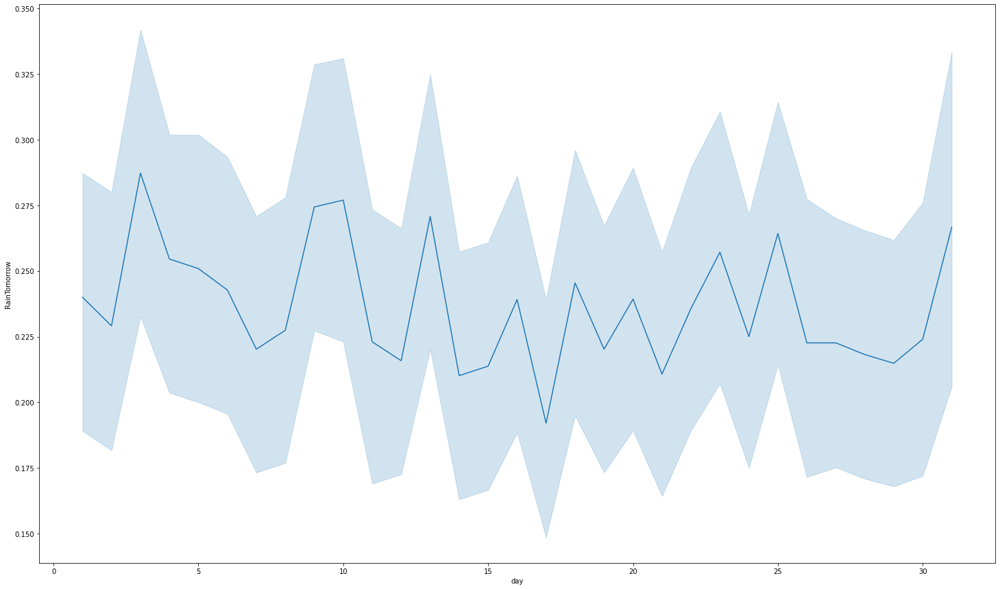

In [61]:
plt.figure(figsize=(25,15))
sns.lineplot(x='day',y='RainTomorrow',data=df)

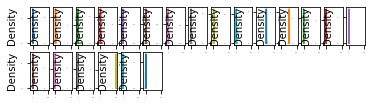

In [62]:
df.plot(kind='density',subplots=True,layout=(5,15), legend=False, fontsize=1);

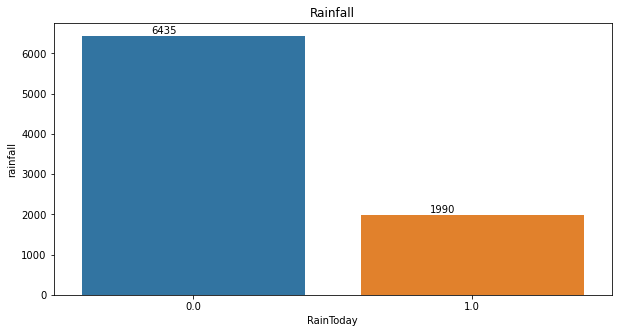

In [63]:
plt.figure(figsize=(10,5))
plt.title('Rainfall')
ax=sns.countplot(x='RainToday',data=df)
plt.xlabel('RainToday')
plt.ylabel('rainfall')
for i  in ax.patches:
    ax.annotate(int(i.get_height()), (i.get_x()+0.25, i.get_height()+1), va='bottom',color='black')

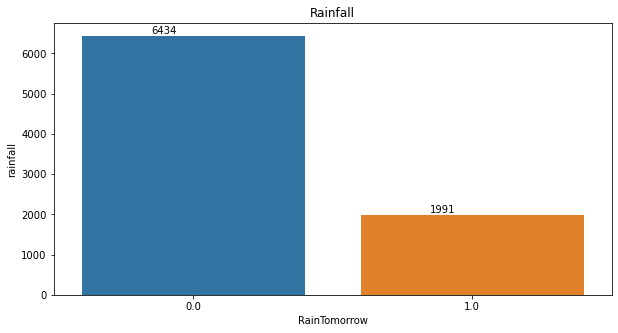

In [64]:
plt.figure(figsize=(10,5))
plt.title('Rainfall')
ax=sns.countplot(x='RainTomorrow',data=df)
plt.xlabel('RainTomorrow')
plt.ylabel('rainfall')
for i  in ax.patches:
    ax.annotate(int(i.get_height()), (i.get_x()+0.25, i.get_height()+1), va='bottom',color='black')

(array([-0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2]),
 [Text(-0.2, 0, '−0.2'),
  Text(0.0, 0, '0.0'),
  Text(0.2, 0, '0.2'),
  Text(0.4000000000000001, 0, '0.4'),
  Text(0.6000000000000001, 0, '0.6'),
  Text(0.8, 0, '0.8'),
  Text(1.0000000000000002, 0, '1.0'),
  Text(1.2000000000000002, 0, '1.2')])

<Figure size 1080x720 with 0 Axes>

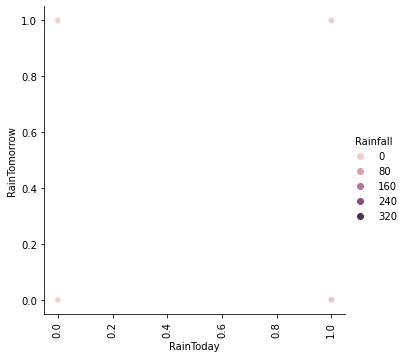

In [65]:
plt.figure(figsize=(15,10))
sns.relplot(x='RainToday', y='RainTomorrow', hue='Rainfall',data=df)
plt.xticks(rotation=90)

<AxesSubplot:>

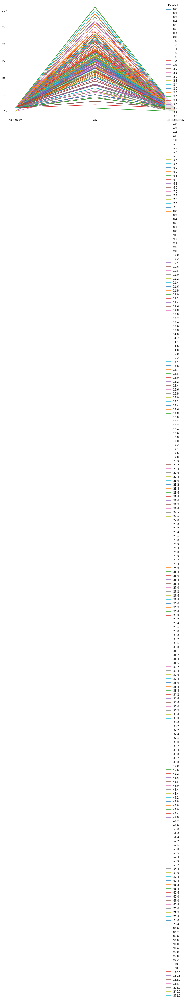

In [66]:
df.groupby('Rainfall')[['RainToday' , 'day' , 'RainTomorrow']].mean().T.plot(figsize=(12,8))

<AxesSubplot:>

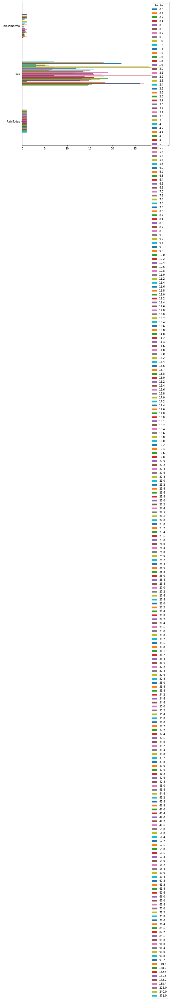

In [67]:
df.groupby('Rainfall')[['RainToday' , 'day' , 'RainTomorrow']].mean().T.plot(kind='barh' , figsize=(10,10))

DATA PREPROCESSING

LABEL ENCODING

In [68]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
for i in object_cols:
    df[i] = label_encoder.fit_transform(df[i])
    
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       8425 non-null   int32  
 1   MinTemp        8425 non-null   float64
 2   MaxTemp        8425 non-null   float64
 3   Rainfall       8425 non-null   float64
 4   Evaporation    8425 non-null   float64
 5   Sunshine       8425 non-null   float64
 6   WindGustDir    8425 non-null   int32  
 7   WindGustSpeed  8425 non-null   float64
 8   WindDir9am     8425 non-null   int32  
 9   WindDir3pm     8425 non-null   int32  
 10  WindSpeed9am   8425 non-null   float64
 11  WindSpeed3pm   8425 non-null   float64
 12  Humidity9am    8425 non-null   float64
 13  Humidity3pm    8425 non-null   float64
 14  Pressure9am    8425 non-null   float64
 15  Pressure3pm    8425 non-null   float64
 16  Cloud9am       8425 non-null   float64
 17  Cloud3pm       8425 non-null   float64
 18  Temp9am 

In [69]:
#dropping the attributes of data that  target and extra columns show
from sklearn import preprocessing
types=df.drop(['RainTomorrow','day','month','year'],axis=1)
target=df['RainTomorrow']
col_names=list(types.columns)
scaler=preprocessing.StandardScaler()
types=scaler.fit_transform(types)
types=pd.DataFrame(types,columns=col_names)
types.describe().T


,count,mean,std,min,25%,50%,75%,max
Location,8425.0,-1.096439e-15,1.000059,-1.831985,-0.883358,0.065269,0.697686,1.646313
MinTemp,8425.0,-2.768046e-16,1.000059,-2.824643,-0.723950,0.019658,0.763266,2.845369
MaxTemp,8425.0,8.905125e-16,1.000059,-2.560539,-0.745132,-0.090932,0.677754,3.539881
Rainfall,8425.0,3.094182e-15,1.000059,-0.264165,-0.264165,-0.264165,-0.186640,35.688028
Evaporation,8425.0,-1.389561e-15,1.000059,-1.307110,-0.273889,-0.118906,0.036077,36.147146
Sunshine,8425.0,1.809519e-15,1.000059,-2.830600,0.090983,0.195325,0.264887,2.003925
WindGustDir,8425.0,-1.673571e-16,1.000059,-1.534940,-0.896959,-0.046318,1.016983,1.654964
WindGustSpeed,8425.0,1.211497e-15,1.000059,-2.397328,-0.655733,-0.075202,0.577896,4.859315
WindDir9am,8425.0,-5.242098e-16,1.000059,-1.584084,-0.930172,-0.058289,1.031564,1.685476
WindDir3pm,8425.0,-1.727599e-16,1.000059,-1.763120,-0.860165,0.042790,0.720006,1.622961


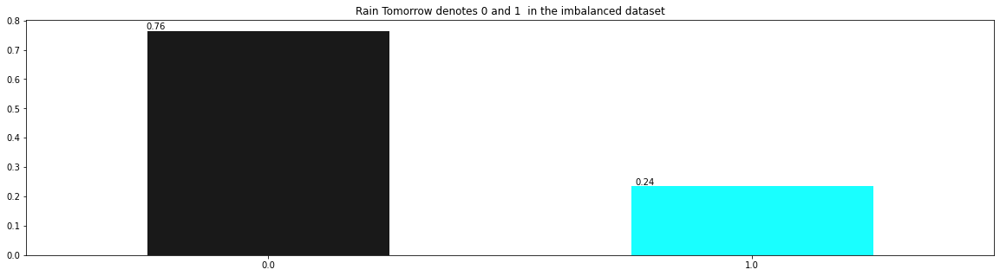

In [70]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,5))
ax=df.RainTomorrow.value_counts(normalize=True).plot(kind='bar', color=['black', 'cyan'], alpha=0.9, rot=0)
plt.title('Rain Tomorrow denotes 0 and 1  in the imbalanced dataset')
for i in ax.patches:
    ax.annotate(str(round(i.get_height(),2)),(i.get_x() * 1.01, i.get_height() * 1.01))
    
plt.show()    

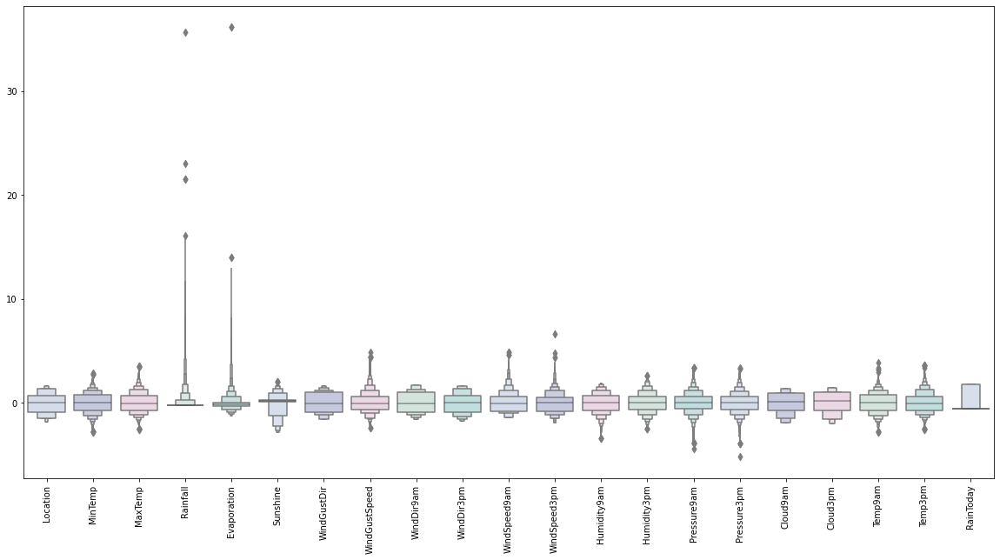

In [71]:
color=["#D0DBEE", "#C2C4E2", "#EED4E5", "#D1E6DC", "#BDE2E2"]
plt.figure(figsize=(20,10))
sns.boxenplot(data=types,palette=color)
plt.xticks(rotation=90)
plt.show()

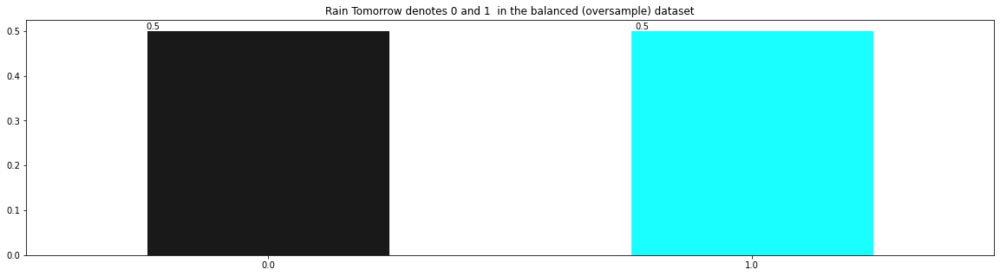

In [72]:
from sklearn.utils import resample

no=df[df.RainTomorrow == 0]
yes=df[df.RainTomorrow == 1]
yes_oversampled=resample(yes, replace=True, n_samples=len(no), random_state=42)
oversampled = pd.concat([no, yes_oversampled])

plt.figure(figsize=(20,5))

ax=oversampled.RainTomorrow.value_counts(normalize=True).plot(kind='bar', color=['black', 'cyan'], alpha=0.9, rot=0)
plt.title('Rain Tomorrow denotes 0 and 1  in the balanced (oversample) dataset')
for i in ax.patches:
    ax.annotate(str(round(i.get_height(),2)),(i.get_x() * 1.01, i.get_height() * 1.01))
    
plt.show()   

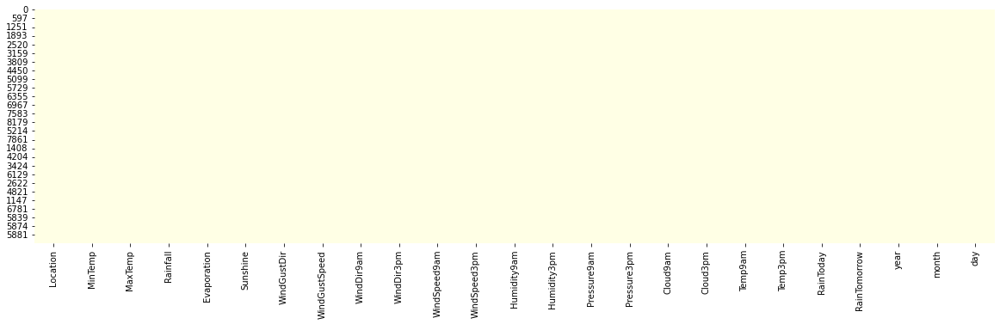

In [73]:
plt.figure(figsize=(20,5))
sns.heatmap(oversampled.isnull(), cbar=False, cmap='YlGn');
plt.show()

In [74]:
total=oversampled.isnull().sum().sort_values(ascending=False)
percent = (oversampled.isnull().sum()/oversampled.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total' , 'Percent'])
missing.head()

,Total,Percent
Location,0,0.0
Humidity3pm,0,0.0
month,0,0.0
year,0,0.0
RainTomorrow,0,0.0


In [75]:
oversampled.select_dtypes(include=['object']).columns

Index([], dtype='object')

In [76]:
oversampled['Location'] = oversampled['Location'].fillna(oversampled['Location'].mode()[0])
oversampled['WindGustDir'] = oversampled['WindGustDir'].fillna(oversampled['WindGustDir'].mode()[0])
oversampled['WindDir9am'] = oversampled['WindDir9am'].fillna(oversampled['WindDir9am'].mode()[0])
oversampled['WindDir3pm'] = oversampled['WindDir3pm'].fillna(oversampled['WindDir3pm'].mode()[0])

LABEL ENCODER

convert categorical features to continous features 

In [77]:
from sklearn.preprocessing import LabelEncoder
LE={}
for col in oversampled.select_dtypes(include=['object']).columns: 
    LE[col] = LabelEncoder()
    oversampled[col]=LE[col].fit_transform(oversampled[col])

In [78]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
MiceImputed=oversampled.copy(deep=True)
mice_imputer=IterativeImputer()
MiceImputed.iloc[:, :] = mice_imputer.fit_transform(oversampled)

OUTLIERS WITH IQR

In [79]:
Q1=MiceImputed.quantile(0.25)
Q3=MiceImputed.quantile(0.75)
IQR=Q3-Q1
print(IQR)

Location          5.0
MinTemp           8.2
MaxTemp           8.5
Rainfall          2.8
Evaporation       1.0
Sunshine          1.9
WindGustDir       9.0
WindGustSpeed    19.0
WindDir9am        9.0
WindDir3pm        7.0
WindSpeed9am     13.0
WindSpeed3pm     15.0
Humidity9am      25.0
Humidity3pm      27.0
Pressure9am       7.3
Pressure3pm       7.5
Cloud9am          3.0
Cloud3pm          3.0
Temp9am           8.0
Temp3pm           8.1
RainToday         1.0
RainTomorrow      1.0
year              4.0
month             5.0
day              15.0
dtype: float64


In [80]:
type(df)

pandas.core.frame.DataFrame

REMOVE OUTLIERS

In [81]:
MiceImputed = MiceImputed[~((MiceImputed < (Q1 - 1.5 * IQR)) |(MiceImputed > (Q3 + 1.5 * IQR))).any(axis=1)]
MiceImputed.shape

(6277, 25)

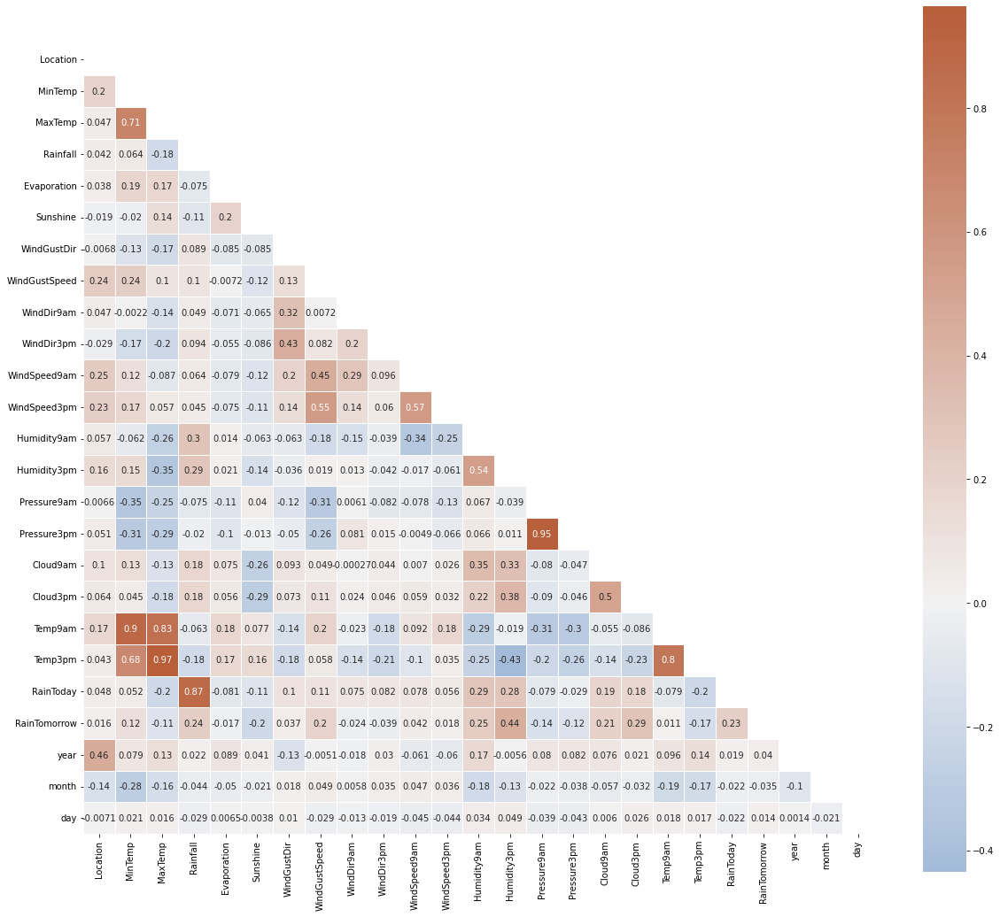

In [82]:
corr = MiceImputed.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(20,20))
cmap = sns.diverging_palette(250, 25, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=True, linewidths=.5, cbar_kws={"shrink": .9})
plt.show()

BUILDING MODELS

In [83]:
from sklearn.model_selection import train_test_split
X=types.drop(["RainToday"],axis=1)
y=types["RainToday"]
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
X.shape

(8425, 20)

In [84]:
# Standardizing data
from sklearn import preprocessing
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(MiceImputed)
modified_data=pd.DataFrame(r_scaler.transform(MiceImputed), index=MiceImputed.index, columns=MiceImputed.columns)

In [85]:
#Feature Importance using Filter Method(Chi-Square)
from sklearn.feature_selection import SelectKBest, chi2
X = modified_data.loc[:, modified_data.columns != 'RainTomorrow']
y = modified_data[['RainTomorrow']]
selector = SelectKBest(chi2, k=10)
selector.fit(X,y)
X_new = selector.transform(X)
print(X.columns[selector.get_support(indices=True)])

Index(['Rainfall', 'Sunshine', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Cloud9am', 'Cloud3pm', 'Temp3pm', 'RainToday'],
      dtype='object')


In [86]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier as rf

X = MiceImputed.drop('RainTomorrow', axis=1)
y=MiceImputed['RainTomorrow']
selector = SelectFromModel(rf(n_estimators=100,random_state=0))
selector.fit(X,y)
support=selector.get_support()
features=X.loc[:, support].columns.tolist()
print(features)
print(rf(n_estimators=100,random_state=0).fit(X,y).feature_importances_)

['MinTemp', 'MaxTemp', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm', 'Pressure3pm', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'day']
[0.02371418 0.04879849 0.04739384 0.03662956 0.01844712 0.02693241
 0.03017538 0.05204069 0.03345952 0.03721221 0.03319467 0.03712062
 0.05720225 0.14186767 0.04019437 0.0439376  0.03146882 0.05429055
 0.04439411 0.05150779 0.01379353 0.02455805 0.02854659 0.04311999]


In [87]:
types=MiceImputed[['Location' , 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed3pm', 'Humidity9am','Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am','Cloud3pm','Temp9am','Temp3pm','RainToday']]
target=MiceImputed['RainTomorrow']
#split into test and train
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(types, target, test_size=0.2, random_state=42, shuffle = True, stratify = target)
#Normalize features
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.fit_transform(X_test)

In [88]:
def plot_roc_cur(fper,tper):
    plt.plot(fper,tper,color='orange', label='ROC')
    plt.plot([0,1],[0,1], color='darkblue',linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.show()

In [89]:
import time
from sklearn.metrics import accuracy_score,roc_auc_score,cohen_kappa_score, plot_confusion_matrix,roc_curve,classification_report
def run_model(model, X_train, y_train,X_test,y_test, verbose=True):
    t0=time.time()
    if verbose == False:
        model.fit(X_train,y_train,verbose=0)
    else:
        model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    accuracy=accuracy_score(y_test,y_pred)
    roc_auc = roc_auc_score(y_test,y_pred)
    c_kap=cohen_kappa_score(y_test,y_pred)
    time_taken=time.time()-t0
    print("Accuracy = {}".format(roc_auc))
    print("ROC Area under Curve = {} ".format(roc_auc))
    print("Cohen kappa = {}".format(c_kap))
    print("Time taken = {}".format(time_taken))
    print(classification_report(y_test,y_pred,digits=5))
    
    probs = model.predict_proba(X_test)  
    probs = probs[:, 1]  
    fper, tper, thresholds = roc_curve(y_test, probs) 
    plot_roc_cur(fper, tper)
    
    plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.Blues, normalize = 'all')
    
    return model, accuracy, roc_auc, c_kap, time_taken

Accuracy = 0.7217411545623836
ROC Area under Curve = 0.7217411545623836 
Cohen kappa = 0.45202142691439784
Time taken = 0.11967921257019043
              precision    recall  f1-score   support

         0.0    0.74093   0.82682   0.78152       716
         1.0    0.72867   0.61667   0.66800       540

    accuracy                        0.73646      1256
   macro avg    0.73480   0.72174   0.72476      1256
weighted avg    0.73565   0.73646   0.73271      1256



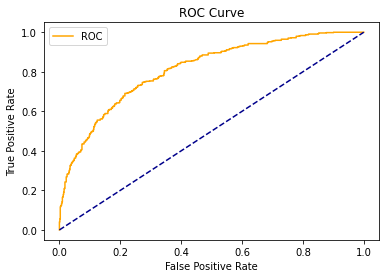

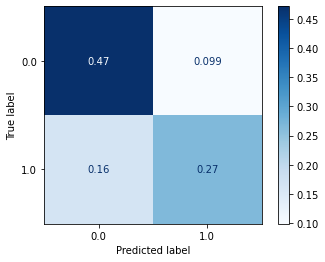

In [90]:
from sklearn.linear_model import LogisticRegression
params_lr = {'penalty' : 'l1', 'solver' : 'liblinear'}
model_lr = LogisticRegression(**params_lr)
model,accuracy_lr,roc_auc_lr,c_kap_lr,tt_lr=run_model(model_lr,X_train,y_train,X_test,y_test)

Accuracy = 0.8762518104696876
ROC Area under Curve = 0.8762518104696876 
Cohen kappa = 0.7468938040375414
Time taken = 0.0269620418548584
              precision    recall  f1-score   support

         0.0    0.90922   0.86732   0.88778       716
         1.0    0.83421   0.88519   0.85894       540

    accuracy                        0.87500      1256
   macro avg    0.87171   0.87625   0.87336      1256
weighted avg    0.87697   0.87500   0.87538      1256



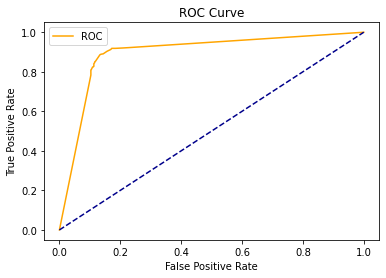

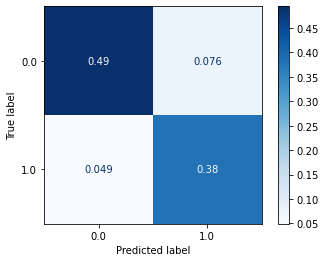

In [91]:
from sklearn.tree import DecisionTreeClassifier
params_dt={'max_depth': 16,'max_features':"sqrt"}
model_dt=DecisionTreeClassifier(**params_dt)
model_dt,accuracy_dt,roc_auc_dt,c_kap_dt,tt_dt=run_model(model_dt,X_train,y_train,X_test,y_test)

Accuracy = 0.9156579764121664
ROC Area under Curve = 0.9156579764121664 
Cohen kappa = 0.8217770141743879
Time taken = 16.795230627059937
              precision    recall  f1-score   support

         0.0    0.95489   0.88687   0.91962       716
         1.0    0.86294   0.94444   0.90186       540

    accuracy                        0.91162      1256
   macro avg    0.90892   0.91566   0.91074      1256
weighted avg    0.91536   0.91162   0.91198      1256



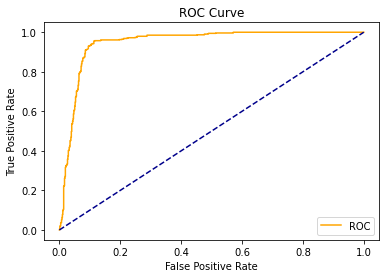

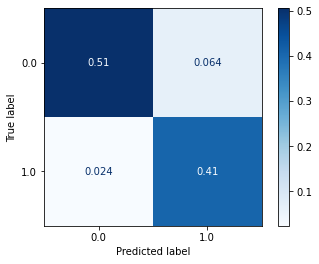

In [92]:
from sklearn.neural_network import MLPClassifier
params_nn={'hidden_layer_sizes':(30,30,30),'activation':'logistic','solver':'lbfgs','max_iter' : 500}
model_nn=MLPClassifier(**params_nn)
model_nn,accuracy_nn,roc_auc_nn,c_kap_nn,tt_nn=run_model(model_nn,X_train,y_train,X_test,y_test)

Accuracy = 0.9584678253672667
ROC Area under Curve = 0.9584678253672667 
Cohen kappa = 0.9171443945445891
Time taken = 1.6974575519561768
              precision    recall  f1-score   support

         0.0    0.96374   0.96508   0.96441       716
         1.0    0.95362   0.95185   0.95273       540

    accuracy                        0.95939      1256
   macro avg    0.95868   0.95847   0.95857      1256
weighted avg    0.95939   0.95939   0.95939      1256



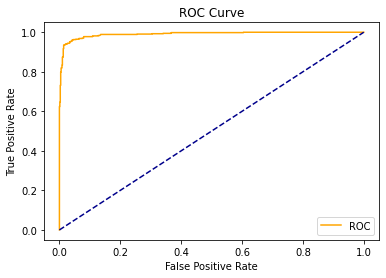

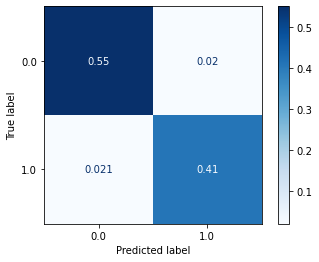

In [93]:
from sklearn.ensemble import RandomForestClassifier
params_rf={'max_depth':16,'min_samples_leaf':1,'min_samples_split':2,'n_estimators':100,'random_state':42}
model_rf=RandomForestClassifier(**params_rf)
model_rf,accuracy_rf,roc_auc_rf,c_kap_rf,tt_rf=run_model(model_rf,X_train,y_train,X_test,y_test)

Accuracy = 0.9574953445065177
ROC Area under Curve = 0.9574953445065177 
Cohen kappa = 0.9110509075176663
Time taken = 6.476681470870972
              precision    recall  f1-score   support

         0.0    0.97418   0.94832   0.96108       716
         1.0    0.93381   0.96667   0.94995       540

    accuracy                        0.95621      1256
   macro avg    0.95399   0.95750   0.95552      1256
weighted avg    0.95682   0.95621   0.95629      1256



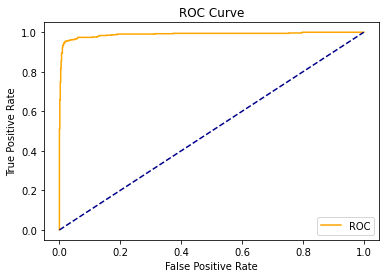

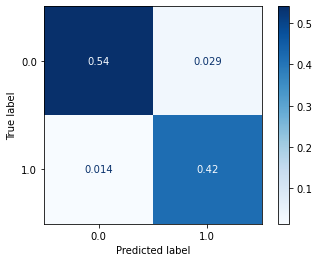

In [94]:
import xgboost as xgb
params_xgb={'n_estimators':500,'max_depth':16}
model_xgb=xgb.XGBClassifier(**params_xgb)
model_xgb,accuracy_xgb,roc_auc__xgb,c_kap_xgb,tt_xgb=run_model(model_xgb,X_train,y_train,X_test,y_test)

TESTING THE DATASETS WITH THE PREDICTIONS

In [95]:
y_pred=model.predict(X_test)
y_pred=(y_pred > 0.5)

<AxesSubplot:>

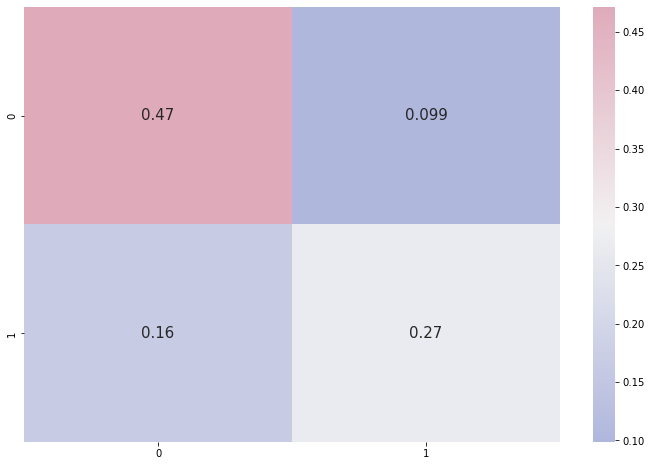

In [96]:
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score
cmap1 = sns.diverging_palette(260,-10,s=50, l=75, n=5, as_cmap=True)
plt.subplots(figsize=(12,8))
cf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(cf_matrix/np.sum(cf_matrix), cmap = cmap1, annot = True, annot_kws = {'size':15})

In [97]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.74      0.83      0.78       716
         1.0       0.73      0.62      0.67       540

    accuracy                           0.74      1256
   macro avg       0.73      0.72      0.72      1256
weighted avg       0.74      0.74      0.73      1256



# CONCLUSION

Problem Statement:

Rain Prediction –Weather forecasting

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 

a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.



here in this rain prediction case , a predictive model with the use of machine learning to forecast  that it will rain tomorrow or not  because it directly impact on human society, timely and accurate can help reduce human and financial loss and when used of machine learning techniques to create models that can predict whether it will rain tomorrow or today  or not based on the weater data for that day in major cities in Australia.

The accuracy score was 73%


# THANK YOU